<a href="https://colab.research.google.com/github/ylkim1947/Section6---Car-damage-detection/blob/main/yolov5_prac.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Data 준비
2. YOLO 모델 
3. 모델 학습
4. 성능 확인 

# 1. Data 준비하기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_type='images'# 'images_normalization'#
from glob import glob
YOLO_path ='/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
DATA_path = YOLO_path+'/Socar_Hackerthon-2'

dataset_path ='/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2'
img_list = glob(DATA_path +f'/train/{data_type}/*.jpg')

print(len(img_list))

2989


In [ ]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.2, random_state=2000)

print(len(train_img_list), len(val_img_list))

2391 598


In [ ]:
with open(DATA_path +'train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open(DATA_path+'/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')

In [ ]:
import yaml

with open(DATA_path +'/data.yaml', 'r') as f:
  data = yaml.load(f,Loader=yaml.FullLoader)

print(data)

data['train'] = DATA_path +'/train.txt'
data['val'] = DATA_path +'/val.txt'

with open(DATA_path +'/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/train.txt', 'val': '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/val.txt'}
{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/train.txt', 'val': '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/val.txt'}


# 2. YOLO 모델 

In [ ]:
import os 
if os.path.isdir(DATA_path):
  %cat '/content/drive/MyDrive/Colab Notebooks/project4/dataset/data.yaml'
else: 
  !curl -L "https://public.roboflow.ai/ds/WKkUorQ71T?key=wIBAdyawPa" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
  %cat '/content/drive/MyDrive/Colab Notebooks/project4/dataset/data.yaml'

names:
- car
nc: 1
test: /content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/test.txt
train: /content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/train.txt


In [ ]:
if os.path.isdir(YOLO_path):
  %cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
  !pip install -r requirements.txt
else:
  %cd /content
  !git clone https://github.com/ultralytics/yolov5.git



/content/drive/MyDrive/Colab Notebooks/project4/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 4.6 MB/s 


In [ ]:
import torch
import utils
display = utils.notebook_init()  # checks

INFO:yolov5:YOLOv5 🚀 2022-9-29 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)
YOLOv5 🚀 2022-9-29 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)


Setup complete ✅ (12 CPUs, 83.5 GB RAM, 22.6/166.8 GB disk)


In [ ]:
from IPython.display import Image  # for displaying images
from utils.downloads import gdrive_download  # for downloading models/datasets

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))


torch 1.12.1+cu113 _CudaDeviceProperties(name='A100-SXM4-40GB', major=8, minor=0, total_memory=40536MB, multi_processor_count=108)


# training


GPU 사용해보기

In [ ]:
torch.cuda.device_count()

1

In [ ]:
%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'

!python train.py --img 416 --batch 128 --epochs 100 --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --cfg '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/models/yolov5s.yaml' --weights yolov5s.pt --name cars_yolov5s_results' --device 0

/content/drive/MyDrive/Colab Notebooks/project4/yolov5
/bin/bash: -c: line 0: unexpected EOF while looking for matching `''
/bin/bash: -c: line 1: syntax error: unexpected end of file


In [ ]:
#import os
#local_rank = int(os.environ["LOCAL_RANK"])
import torch
%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
#!python -m torch.distributed.launch --nproc_per_node 2 train.py --img 416 --batch 64 --epochs 100 --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --cfg '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/models/yolov5s.yaml' --weights yolov5s.pt --name cars_yolov5s_results
!torchrun --standalone --nnodes=1:4 --nproc_per_node 1  train.py --img 416 --batch 256 --epochs 100 --workers 40 --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --cfg '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/models/yolov5s.yaml' --weights yolov5s.pt --name cars_yolov5s_results  --device 0

/content/drive/MyDrive/Colab Notebooks/project4/yolov5
train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/Colab Notebooks/project4/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=256, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=40, project=runs/train, name=cars_yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2022-9-29 Python-3.7.15 torch-1.12.1+cu113 CUDA

In [ ]:
pip install -U tensorboard-plugin-profile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.3 MB 4.8 MB/s 


In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/'

<IPython.core.display.Javascript object>

In [ ]:
!pip install clearml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from IPython.display import Image
import os

val_img_path = val_img_list[100]

!python detect.py --weights '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt' --img 416 --conf 0.5 --source "{val_img_path}"



detect: weights=['/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/train/images/20190427_4766_22408430_18532e35d042383aca9cda898f0c68f9.rf.c80ebec8faaa20cc9e8bc089298da84f.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2022-9-29 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/driv

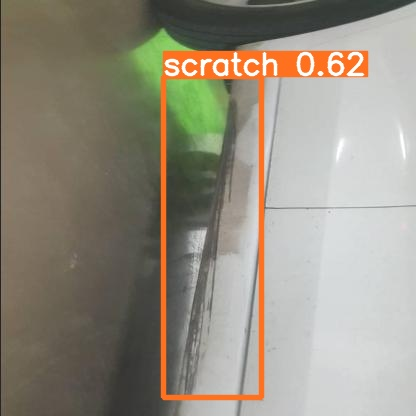

In [ ]:
Image(os.path.join('/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/detect/exp13', os.path.basename(val_img_path)))

## Test new dataset 

In [ ]:
testdata_path ='/content/drive/MyDrive/Colab Notebooks Notebooks/project4/car-damage-dataset/data1a/training/00-damage'
testimg_list = glob(testdata_path +'/*.jpeg')

print(len(testimg_list))

54


In [ ]:
testimg_path = testimg_list[4]

!python detect.py --weights '/content/drive/MyDrive/Colab Notebooks Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt' --img 416 --conf 0.5 --source "{testimg_path}"



detect: weights=['/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/project4/car-damage-dataset/data1a/training/00-damage/0710.jpeg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2022-9-29 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/Colab Notebooks/project4/car-damage-dataset/data1a/training/00-damage/

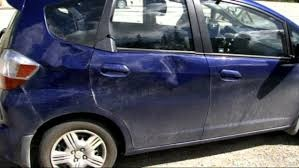

In [ ]:
Image(os.path.join('/content/drive/MyDrive/Colab Notebooks Notebooks/project4/yolov5/runs/detect/exp19', os.path.basename(testimg_path)))

# 성능 평가


In [ ]:
## cars_yolov5s_results2
%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
# task  'speed or study' 'val'
!python val.py --weights '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt' --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --img 416 --task 'val'


/content/drive/MyDrive/Colab Notebooks/project4/yolov5
val: data=/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml, weights=['/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2022-9-29 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients
val: Scanning '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/val' images and labels...598 found, 0 missing, 0 empty, 0 corrupt: 100% 598/598 [12:32<00:00,  1.26s/it]
val: New cache created: /content/dri

In [ ]:
## cars_yolov5s_results3

%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
# task  'speed or study' 'val'
!python val.py --weights '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results3/weights/best.pt' --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --img 416 --task 'val'


/content/drive/MyDrive/Colab Notebooks/project4/yolov5
val: data=/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml, weights=['/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results2/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=study, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False

Running study_data_best.txt --imgsz 256...
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2022-9-29 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients
val: Scanning '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/val.cache' images and labels... 598 found, 0 missing, 0 empty, 0 corrupt: 100% 598/598 [00:00<?

In [ ]:
## cars_yolov5s_results4
%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
# task  'speed or study' 'val'
!python val.py --weights '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results4/weights/best.pt' --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --img 416 --task 'val'


In [ ]:
## cars_yolov5s_results5
%cd '/content/drive/MyDrive/Colab Notebooks/project4/yolov5'
# task  'speed or study' 'val'
!python val.py --weights '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/runs/train/cars_yolov5s_results5/weights/best.pt' --data '/content/drive/MyDrive/Colab Notebooks/project4/yolov5/Socar_Hackerthon-2/data.yaml' --img 416 --task 'val'
